In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Pytorch-Models/

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models


In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [2]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [2]:
!ls mmdetection/configs/yolact/

metafile.yml		      yolact_r50_1xb8-55e_coco.py  yolact_r50_pheno.py
README.md		      yolact_r50_8xb8-55e_coco.py
yolact_r101_1xb8-55e_coco.py  yolact_r50_markers.py


In [ ]:
custom_cfg = """
_base_ = 'yolact_r50_1xb8-55e_coco.py'

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Normalization
img_norm_cfg = dict(
    mean=[123.68, 116.78, 103.94], std=[58.40, 57.12, 57.38], to_rgb=True)

# Pipelines
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='PackDetInputs', meta_keys=('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor'))
]

# Data loader
train_dataloader = dict(
    batch_size=8,
    num_workers=2,
    dataset=dict(
        _delete_=True,
        type=dataset_type,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img),
        filter_cfg=dict(filter_empty_gt=True, min_size=32),
        pipeline=train_pipeline,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

val_dataloader = dict(
    batch_size=8,
    num_workers=2,
    dataset=dict(
        _delete_=True,
        type=dataset_type,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img),
        pipeline=test_pipeline,
        test_mode=True,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

test_dataloader = val_dataloader

# Evaluator
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'])
# val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'], classwise=True)
test_evaluator = val_evaluator

# Model
model = dict(
    type='YOLACT',
    data_preprocessor=dict(
        type='DetDataPreprocessor',
        mean=img_norm_cfg['mean'],
        std=img_norm_cfg['std'],
        bgr_to_rgb=img_norm_cfg['to_rgb'],
        pad_mask=True),
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=-1,  # do not freeze stem
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,  # update the statistics of bn
        zero_init_residual=False,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet50')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        start_level=1,
        add_extra_convs='on_input',
        num_outs=5,
        upsample_cfg=dict(mode='bilinear')),
    bbox_head=dict(
        type='YOLACTHead',
        num_classes=num_classes,
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            octave_base_scale=3,
            scales_per_octave=1,
            base_sizes=[8, 16, 32, 64, 128],
            ratios=[0.5, 1.0, 2.0],
            strides=[550.0 / x for x in [69, 35, 18, 9, 5]],
            centers=[(550 * 0.5 / x, 550 * 0.5 / x)
                     for x in [69, 35, 18, 9, 5]]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[.0, .0, .0, .0],
            target_stds=[0.1, 0.1, 0.2, 0.2]),
        loss_cls=dict(
            type='CrossEntropyLoss',
            use_sigmoid=False,
            reduction='none',
            loss_weight=1.0),
        loss_bbox=dict(type='SmoothL1Loss', beta=1.0, loss_weight=1.5),
        num_head_convs=1,
        num_protos=32,
        use_ohem=True),
    mask_head=dict(
        type='YOLACTProtonet',
        in_channels=256,
        num_protos=32,
        num_classes=num_classes,
        max_masks_to_train=100,
        loss_mask_weight=6.125,
        with_seg_branch=True,
        loss_segm=dict(
            type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0)),
    # training and testing settings
    train_cfg=dict(
        assigner=dict(
            type='MaxIoUAssigner',
            pos_iou_thr=0.5,
            neg_iou_thr=0.4,
            min_pos_iou=0.,
            ignore_iof_thr=-1,
            gt_max_assign_all=False),
        sampler=dict(type='PseudoSampler'),  # YOLACT should use PseudoSampler
        # smoothl1_beta=1.,
        allowed_border=-1,
        pos_weight=-1,
        neg_pos_ratio=3,
        debug=False),
    test_cfg=dict(
        nms_pre=1000,
        min_bbox_size=0,
        score_thr=0.05,
        mask_thr=0.5,
        iou_thr=0.5,
        top_k=200,
        max_per_img=100,
        mask_thr_binary=0.5))

# Schedule
train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=3, val_interval=1)
val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.001, momentum=0.9, weight_decay=0.0005),
    clip_grad=None
)

# Learning policy
param_scheduler = [
    dict(type='LinearLR', start_factor=0.1, by_epoch=False, begin=0, end=500),
    dict(
        type='MultiStepLR',
        begin=0,
        end=3,
        by_epoch=True,
        milestones=[2, 3],
        gamma=0.1
    )
]

# Logging and checkpointing
default_hooks = dict(
    logger=dict(type='LoggerHook', interval=1),
    checkpoint=dict(type='CheckpointHook', interval=1)
)

# Output path
work_dir = '/content/gdrive/MyDrive/Pytorch-Models/mmdetection/mmdet_outputs/yolact_r50_pheno'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v2.0/yolact/yolact_r50_1x8_coco/yolact_r50_1x8_coco_20200908-f38d58df.pth'
"""

with open('mmdetection/configs/yolact/yolact_r50_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py mmdetection/configs/yolact/yolact_r50_pheno.py

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
02/16 07:50:33 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 2009309973
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/configs/yolact/yolact_r50_pheno.py mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
02/16 08:50:07 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1004767404
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [6]:
from mmdet.apis import init_detector, inference_detector
import mmcv

# Config and checkpoint paths
config_file = 'mmdetection/configs/yolact/yolact_r50_markers.py'
checkpoint_file = 'mmdetection/mmdet_outputs/yolact_r50_markers/epoch_10.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

# Image path
img = '/content/gdrive/MyDrive/Pytorch-Models/datasets/markerpensseg/valid/1B3246F6-8785-4465-AC56-3BE7AA44003D_jpeg.rf.ddd6b9b6921d9589dfae0019661b06a1.jpg'

# Run inference
result = inference_detector(model, img)
print(result)

Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/yolact_r50_markers/epoch_10.pth
<DetDataSample(

    META INFORMATION
    img_path: '/content/gdrive/MyDrive/Pytorch-Models/datasets/markerpensseg/valid/1B3246F6-8785-4465-AC56-3BE7AA44003D_jpeg.rf.ddd6b9b6921d9589dfae0019661b06a1.jpg'
    batch_input_shape: (512, 512)
    img_shape: (512, 512)
    ori_shape: (2048, 1536)
    pad_shape: (512, 512)
    scale_factor: (0.3333333333333333, 0.25)
    img_id: 0

    DATA FIELDS
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            masks: BitmapMasks(num_masks=0, height=2048, width=1536)
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
        ) at 0x79d7ee7dd910>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            masks: tensor([[[False, False, False,  ..., False, Fals

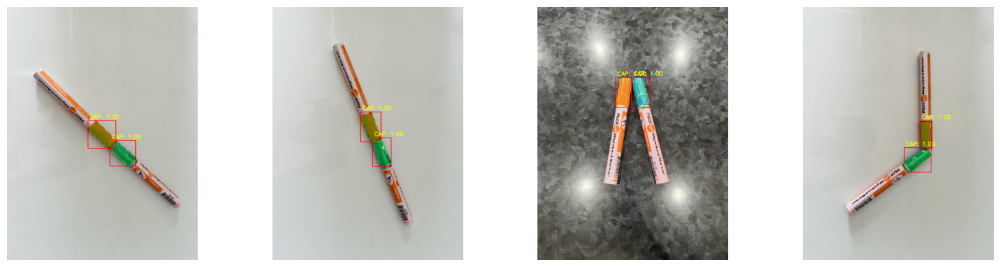

In [10]:
import os
import random
# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Pytorch-Models/datasets/markerpensseg/valid/"

# Class labels
CLASS_LABELS = ["CAP"]

PRED_COLORS = {0: (0, 255, 0)}

def draw_bbox_with_label(img, bbox, label, score, color=(0, 0, 255), thickness=3):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, f"{label}: {score:.2f}", (xmin + 15, ymin - 15),
        cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 255), 3, cv2.LINE_AA
    )

# visualization layout
N = 4
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(1, 4, ii+1)

    img = cv2.imread(image)

    results = inference_detector(model, image)

    # Access the prediction results from the DetDataSample object
    pred_instances = results.pred_instances

    CONF_THRESHOLD = 0.3
    img_with_masks = img.copy()

    # Draw boxes and labels
    # pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
    for i in range(len(pred_instances.bboxes)):
        score = pred_instances.scores[i]
        if score < CONF_THRESHOLD:
            continue

        # 1. Get Class and Color
        label_id = pred_instances.labels[i].item()
        class_name = CLASS_LABELS[label_id]
        color = PRED_COLORS[label_id]

        # 2. Extract and Process Mask
        # pred_instances.masks is a boolean tensor of shape (N, H, W)
        mask = pred_instances.masks[i].cpu().numpy()

        # Create a colored version of the mask
        colored_mask = np.zeros_like(img, dtype=np.uint8)
        colored_mask[mask] = color

        # 3. Overlay Mask onto Image (Alpha Blending)
        alpha = 0.4  # Transparency level
        img_with_masks = cv2.addWeighted(img_with_masks, 1.0, colored_mask, alpha, 0)

        # 4. Draw Bounding Box and Label
        bbox = pred_instances.bboxes[i].tolist()
        draw_bbox_with_label(img_with_masks, bbox, class_name, score, color=(0, 0, 255))

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [11]:
from mmdet.apis import init_detector, inference_detector
import mmcv

# Config and checkpoint paths
config_file = 'mmdetection/configs/yolact/yolact_r50_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

# Image path
img = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'

# Run inference
result = inference_detector(model, img)
print(result)

Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.pth
<DetDataSample(

    META INFORMATION
    img_path: '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
    batch_input_shape: (512, 512)
    img_shape: (512, 512)
    ori_shape: (1024, 1024)
    pad_shape: (512, 512)
    scale_factor: (0.5, 0.5)
    img_id: 0

    DATA FIELDS
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            masks: BitmapMasks(num_masks=0, height=1024, width=1024)
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
        ) at 0x79d7e6311f10>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            masks: tensor([[[False, False, False,  ..., False, False, False],
                         [False, False, False,  ..., 

Loads checkpoint by local backend from path: mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.pth


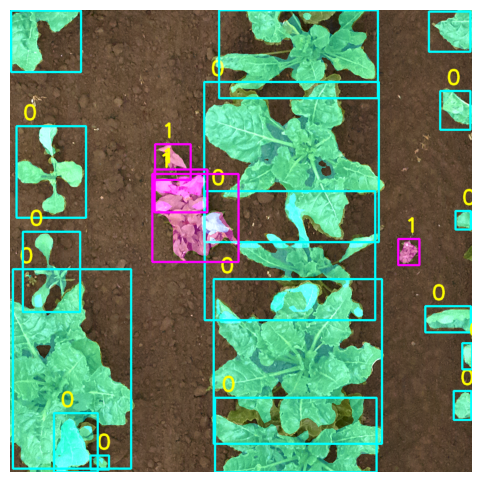

In [4]:
from mmdet.apis import init_detector, inference_detector
import mmcv
import cv2
import matplotlib.pyplot as plt
import torch
import numpy as np

# Class labels
CLASS_LABELS = ["0", "1"]

PRED_COLORS = {0: (255, 255, 0),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# Config and checkpoint paths
config_file = 'mmdetection/configs/yolact/yolact_r50_pheno.py'
checkpoint_file = 'mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.pth'

# Initialize the model
model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or 'cpu'

def draw_bbox_with_label(img, bbox, label, color=(0, 0, 255), thickness=3):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, label, (xmin + 15, ymin - 15),
        cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 255), 3, cv2.LINE_AA
    )

# Image path
img_path = '/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png'
img = cv2.imread(img_path)
if img is None:
    raise Exception("Image not found or unreadable")

# Run inference
results = inference_detector(model, img_path)

# Access the prediction results from the DetDataSample object
pred_instances = results.pred_instances

CONF_THRESHOLD = 0.3
img_with_masks = img.copy()

# Draw boxes and labels
# pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
for i in range(len(pred_instances.bboxes)):
    score = pred_instances.scores[i]
    if score < CONF_THRESHOLD:
        continue

    # 1. Get Class and Color
    label_id = pred_instances.labels[i].item()
    class_name = CLASS_LABELS[label_id]
    color = PRED_COLORS[label_id]

    # 2. Extract and Process Mask
    # pred_instances.masks is a boolean tensor of shape (N, H, W)
    mask = pred_instances.masks[i].cpu().numpy()

    # Create a colored version of the mask
    colored_mask = np.zeros_like(img, dtype=np.uint8)
    colored_mask[mask] = color

    # 3. Overlay Mask onto Image (Alpha Blending)
    alpha = 0.4  # Transparency level
    img_with_masks = cv2.addWeighted(img_with_masks, 1.0, colored_mask, alpha, 0)

    # 4. Draw Bounding Box and Label
    bbox = pred_instances.bboxes[i].tolist()
    draw_bbox_with_label(img_with_masks, bbox, class_name, color=color)

# Show result
img_with_bbox_rgb = cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6, 6))
plt.axis('off')
plt.imshow(img_with_bbox_rgb)
plt.show()

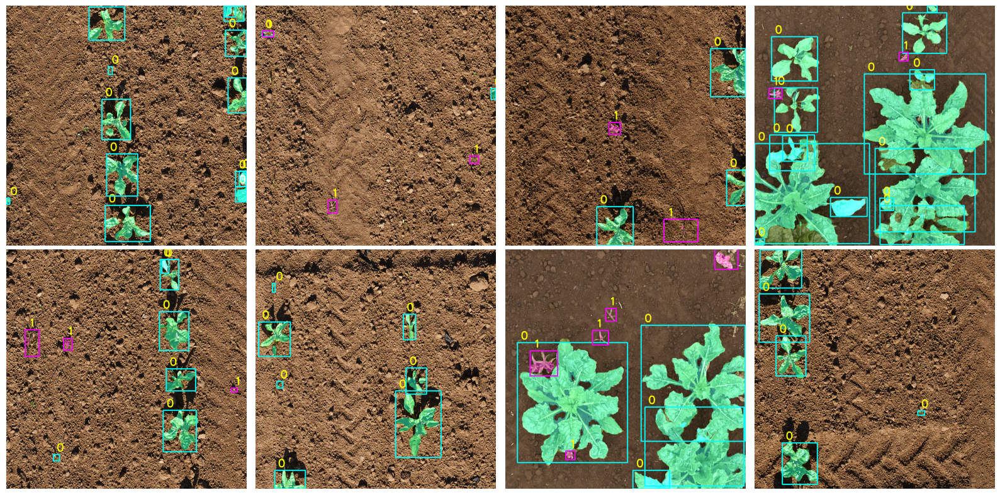

In [13]:
import os
import random
# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/"

# Class labels
CLASS_LABELS = ["0", "1"]

PRED_COLORS = {0: (255, 255, 0),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

def draw_bbox_with_label(img, bbox, label, color=(0, 0, 255), thickness=3):
    xmin, ymin, xmax, ymax = map(int, bbox)
    # Draw rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, thickness)
    # Put label text
    cv2.putText(
        img, label, (xmin + 15, ymin - 15),
        cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 255), 3, cv2.LINE_AA
    )

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)

    results = inference_detector(model, image)

    # Access the prediction results from the DetDataSample object
    pred_instances = results.pred_instances

    CONF_THRESHOLD = 0.3
    img_with_masks = img.copy()

    # Draw boxes and labels
    # pred_instances.bboxes, pred_instances.scores, and pred_instances.labels are tensors
    for i in range(len(pred_instances.bboxes)):
        score = pred_instances.scores[i]
        if score < CONF_THRESHOLD:
            continue

        # 1. Get Class and Color
        label_id = pred_instances.labels[i].item()
        class_name = CLASS_LABELS[label_id]
        color = PRED_COLORS[label_id]

        # 2. Extract and Process Mask
        # pred_instances.masks is a boolean tensor of shape (N, H, W)
        mask = pred_instances.masks[i].cpu().numpy()

        # Create a colored version of the mask
        colored_mask = np.zeros_like(img, dtype=np.uint8)
        colored_mask[mask] = color

        # 3. Overlay Mask onto Image (Alpha Blending)
        alpha = 0.4  # Transparency level
        img_with_masks = cv2.addWeighted(img_with_masks, 1.0, colored_mask, alpha, 0)

        # 4. Draw Bounding Box and Label
        bbox = pred_instances.bboxes[i].tolist()
        draw_bbox_with_label(img_with_masks, bbox, class_name, color=color)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [14]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 71.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 143.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.3/159.3 kB 27.5 MB/s eta 0:00:00
  Attempting uninstall: ml_dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.18.0 requires ml-dtypes<0.5.0,>=0.4.0, but you have ml-dtypes 0.5.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.

In [15]:
import torch

In [16]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [ ]:
for name, module in model.named_modules():
    if "proto" in name.lower() or "mask" in name.lower():
        print(name, "->", type(module))

mask_head -> <class 'mmdet.models.dense_heads.yolact_head.YOLACTProtonet'>
mask_head.segm_branch -> <class 'mmdet.models.dense_heads.yolact_head.SegmentationModule'>
mask_head.segm_branch.segm_conv -> <class 'torch.nn.modules.conv.Conv2d'>
mask_head.loss_segm -> <class 'mmdet.models.losses.cross_entropy_loss.CrossEntropyLoss'>
mask_head.protonet -> <class 'torch.nn.modules.container.Sequential'>
mask_head.protonet.0 -> <class 'torch.nn.modules.conv.Conv2d'>
mask_head.protonet.1 -> <class 'torch.nn.modules.activation.ReLU'>
mask_head.protonet.2 -> <class 'torch.nn.modules.conv.Conv2d'>
mask_head.protonet.3 -> <class 'torch.nn.modules.activation.ReLU'>
mask_head.protonet.4 -> <class 'torch.nn.modules.conv.Conv2d'>
mask_head.protonet.5 -> <class 'torch.nn.modules.activation.ReLU'>
mask_head.protonet.6 -> <class 'mmdet.models.dense_heads.yolact_head.InterpolateModule'>
mask_head.protonet.7 -> <class 'torch.nn.modules.activation.ReLU'>
mask_head.protonet.8 -> <class 'torch.nn.modules.conv.C

In [ ]:
import torch
from mmdet.structures import DetDataSample
from mmengine.structures import InstanceData

# 1. Setup mock data (added bboxes/labels to satisfy the assigner tracer if it leaks)
data_sample = DetDataSample()
data_sample.set_metainfo({
    'img_shape': (512, 512),
    'ori_shape': (512, 512),
    'pad_shape': (512, 512),
})

# Prime InstanceData with dummy tensors to prevent 'no attribute' errors
device = next(model.parameters()).device
dummy_instances = InstanceData()
dummy_instances.bboxes = torch.zeros((0, 4), device=device)
dummy_instances.labels = torch.zeros((0,), dtype=torch.long, device=device)

data_sample.gt_instances = dummy_instances
data_sample.pred_instances = dummy_instances
batch_data_samples = [data_sample.to(device)]

# 2. Wrapper that strictly isolates the forward pass
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.model.eval()

    def forward(self, inputs):
        with torch.no_grad():
            # 1. Get the features
            feats = self.model.extract_feat(inputs)

            # 2. Get the 3 outputs (cls, box, coeff) that the head just gave us
            out = self.model.bbox_head(feats)
            cls, box, coeff = out # Now unpacking the 3 we actually got

            # 3. Manually trigger the Protonet to get the 4th piece (Mask Prototypes)
            # In YOLACT, the Protonet usually takes the first level of features (P3)]
            if hasattr(self.model, 'mask_head') and hasattr(self.model.mask_head, 'protonet'):
                proto = self.model.mask_head.protonet(feats[0])
            else:
                proto = torch.zeros((1, 32, 128, 128), device=inputs.device)

            # Ensure proto is 4D for the export
            if len(proto.shape) == 3:
                proto = proto.unsqueeze(0)

            return cls, box, coeff, proto

# 3. Export with Opsets 11 or 12 (important for YOLACT's resize/mask ops)
model.eval()
wrapped_model = ModelWrapper(model).to(device)

In [ ]:
dummy_input = torch.randn(1, 3, 512, 512).to(device)
onnx_model_path = "mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.onnx"
torch.onnx.export(
    wrapped_model,
    dummy_input,
    onnx_model_path,
    opset_version=12,
    input_names=["input"],
    output_names=["boxes", "labels", "scores"],
    dynamic_axes={
        "input": {0: "batch_size", 2: "height", 3: "width"},
        "boxes": {0: "num_boxes"},
        "labels": {0: "num_boxes"},
        "scores": {0: "num_boxes"},
    },
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX export mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.onnx completed successfully!


In [17]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.6/252.6 MB 8.8 MB/s eta 0:00:00


In [20]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/06-05_00108_P0037822.png"

mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (512, 512))
img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(1, 9, 64, 64), (1, 9, 32, 32), (1, 9, 16, 16), (1, 9, 8, 8), (1, 9, 4, 4), (1, 12, 64, 64), (1, 12, 32, 32), (1, 12, 16, 16), (1, 12, 8, 8), (1, 12, 4, 4), (1, 96, 64, 64), (1, 96, 32, 32), (1, 96, 16, 16), (1, 96, 8, 8), (1, 96, 4, 4), (1, 32, 128, 128)]


In [ ]:
for i, o in enumerate(outputs):
    print(i, o.shape, o.min(), o.max())

0 (1, 9, 64, 64) -5.605974 6.1210594
1 (1, 9, 32, 32) -5.892939 5.8431673
2 (1, 9, 16, 16) -5.62829 5.915335
3 (1, 9, 8, 8) -6.203165 5.518895
4 (1, 9, 4, 4) -4.8992515 6.0934367
5 (1, 12, 64, 64) -11.884726 3.8049316
6 (1, 12, 32, 32) -3.8929052 3.6420538
7 (1, 12, 16, 16) -3.9868746 3.7604802
8 (1, 12, 8, 8) -3.8378284 2.9760516
9 (1, 12, 4, 4) -4.121185 1.7250298
10 (1, 96, 64, 64) -0.9999674 0.99999964
11 (1, 96, 32, 32) -0.99649763 0.9999943
12 (1, 96, 16, 16) -0.99933994 0.99963266
13 (1, 96, 8, 8) -0.99958944 0.99997485
14 (1, 96, 4, 4) -0.9976739 0.9965004
15 (1, 32, 128, 128) 0.0 19.247765


In [ ]:
import onnxruntime
import numpy as np
import cv2
import torch
import os
import random

# Load image and preprocess
img_path = "/content/gdrive/MyDrive/Pytorch-Models/datasets/markerpensseg/valid/1B3246F6-8785-4465-AC56-3BE7AA44003D_jpeg.rf.ddd6b9b6921d9589dfae0019661b06a1.jpg"

mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (512, 512))
img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/yolact_r50_markers/epoch_10.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(1, 6, 64, 64), (1, 6, 32, 32), (1, 6, 16, 16), (1, 6, 8, 8), (1, 6, 4, 4), (1, 12, 64, 64), (1, 12, 32, 32), (1, 12, 16, 16), (1, 12, 8, 8), (1, 12, 4, 4), (1, 96, 64, 64), (1, 96, 32, 32), (1, 96, 16, 16), (1, 96, 8, 8), (1, 96, 4, 4), (1, 32, 128, 128)]


In [ ]:
# strides = model.bbox_head.prior_generator.strides
# print(strides)

In [18]:
def compute_iom(box, boxes):
    x1 = np.maximum(box[0], boxes[:,0])
    y1 = np.maximum(box[1], boxes[:,1])
    x2 = np.minimum(box[2], boxes[:,2])
    y2 = np.minimum(box[3], boxes[:,3])

    inter_w = np.maximum(0, x2 - x1)
    inter_h = np.maximum(0, y2 - y1)
    inter = inter_w * inter_h

    area1 = (box[2]-box[0]) * (box[3]-box[1])
    area2 = (boxes[:,2]-boxes[:,0]) * (boxes[:,3]-boxes[:,1])

    min_area = np.minimum(area1, area2) + 1e-6
    return inter / min_area

def nms_iom(boxes, scores, coeffs=None, thr=0.5):
    order = scores.argsort()[::-1]

    keep_boxes = []
    keep_scores = []
    keep_coeffs = [] if coeffs is not None else None

    while len(order) > 0:
        i = order[0]

        keep_boxes.append(boxes[i])
        keep_scores.append(scores[i])
        if coeffs is not None:
            keep_coeffs.append(coeffs[i])

        if len(order) == 1:
            break

        rest = order[1:]

        iom = compute_iom(boxes[i], boxes[rest])

        inds = np.where(iom < thr)[0]
        order = rest[inds]

    keep_boxes = np.array(keep_boxes)
    keep_scores = np.array(keep_scores)
    if coeffs is not None:
        keep_coeffs = np.array(keep_coeffs)

    return keep_boxes, keep_scores, keep_coeffs

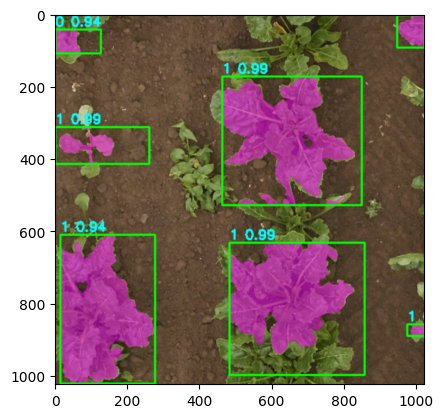

In [ ]:
import torch
from torchvision.ops import nms
import numpy as np
import cv2
from matplotlib import pyplot as plt

# ---------------- CONFIG ----------------
# STRIDES = [7.97101449, 15.71428571, 30.55555556, 61.11111111, 110.0]
STRIDES = [8, 16, 32,64, 128]
RATIOS  = [0.5, 1.0, 2.0]
CONF_THR = 0.9
IOU_THR  = 0.3
VARIANCES = [0.1, 0.1, 0.2, 0.2]
NUM_MASK_COEFF = 32
INPUT_SIZE = 512
# ----------------------------------------
orig_h, orig_w = img.shape[:2]

all_boxes = []
all_scores = []
all_coeffs = []
all_labels = []

# ----------- DECODE PER FPN LEVEL -----------
for i, stride in enumerate(STRIDES):

    cls_map   = outputs[i][0]       # (6, H, W)
    bbox_map  = outputs[i+5][0]     # (12, H, W)
    coeff_map = outputs[i+10][0]    # (96, H, W)

    _, H, W = cls_map.shape

    # reshape
    bbox_map  = bbox_map.reshape(3, 4, H, W).transpose(2,3,0,1).reshape(-1,4)
    coeff_map = coeff_map.reshape(3, NUM_MASK_COEFF, H, W)\
                          .transpose(2,3,0,1).reshape(-1,NUM_MASK_COEFF)

    A = 3
    C = cls_map.shape[0] // A

    cls_map = cls_map.reshape(A, C, H, W)
    cls_map = cls_map.transpose(2, 3, 0, 1)  # H,W,A,C
    cls_map = cls_map.reshape(-1, C)

    scores = 1 / (1 + np.exp(-cls_map[:,0]))
    labels = np.argmax(cls_map[:,1:], axis=1)

    # anchor centers
    y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')
    cx = (x.flatten() + 0.5) * stride
    cy = (y.flatten() + 0.5) * stride

    cx = np.repeat(cx, 3)
    cy = np.repeat(cy, 3)

    # anchor sizes
    BASE_SIZES = [8,16,32,64,128]
    OCTAVE_BASE_SCALE = 3

    anchor_wh = []
    base = BASE_SIZES[i] * OCTAVE_BASE_SCALE

    for r in RATIOS:
        w = base * np.sqrt(r)
        h = base / np.sqrt(r)
        anchor_wh.append([w, h])

    anchor_wh = np.tile(np.array(anchor_wh), (H*W,1))

    # decode bbox
    dx = bbox_map[:,0]
    dy = bbox_map[:,1]
    dw = bbox_map[:,2]
    dh = bbox_map[:,3]

    px = cx + dx * VARIANCES[0] * anchor_wh[:,0]
    py = cy + dy * VARIANCES[1] * anchor_wh[:,1]
    pw = anchor_wh[:,0] * np.exp(dw * VARIANCES[2])
    ph = anchor_wh[:,1] * np.exp(dh * VARIANCES[3])

    boxes = np.stack([
        px - pw/2,
        py - ph/2,
        px + pw/2,
        py + ph/2
    ], axis=1)

    keep = scores > 0.05
    if np.any(keep):
        all_boxes.append(boxes[keep])
        all_scores.append(scores[keep])
        all_coeffs.append(coeff_map[keep])
        all_labels.append(labels[keep])

# -------------- CONCAT --------------
boxes  = np.concatenate(all_boxes)
scores = np.concatenate(all_scores)
coeffs = np.concatenate(all_coeffs)
labels = np.concatenate(all_labels)

# -------------- NMS --------------
# keep only top 200 by score
topk = 200
if len(scores) > topk:
    idx = np.argsort(-scores)[:topk]
    boxes  = boxes[idx]
    scores = scores[idx]
    coeffs = coeffs[idx]
    labels = labels[idx]

# -------------- FILTER FIRST --------------
mask = scores > CONF_THR
boxes  = boxes[mask]
scores = scores[mask]
coeffs = coeffs[mask]
labels = labels[mask]

# -------------- NMS --------------
w = boxes[:,2] - boxes[:,0]
h = boxes[:,3] - boxes[:,1]
valid = (w > 1) & (h > 1)

boxes  = boxes[valid]
scores = scores[valid]
coeffs = coeffs[valid]
labels = labels[valid]

boxes, scores, coeffs = nms_iom(
    boxes,
    scores,
    coeffs,
    thr=IOU_THR
)

# -------------- MASK BUILD --------------
proto = outputs[15][0]  # (32,128,128)

# reshape to (H*W, 32)
proto = proto.reshape(32, -1).transpose(1,0)   # (16384, 32)

# coeffs: (N,32)
masks = proto @ coeffs.T   # (16384, N)

masks = 1 / (1 + np.exp(-masks))  # sigmoid

masks = masks.transpose(1,0).reshape(-1,128,128)

# -------------- VISUALIZE --------------
img_vis = img_resized.copy()

proto_h, proto_w = 128, 128
scale_x = proto_w / INPUT_SIZE
scale_y = proto_h / INPUT_SIZE

for i in range(len(boxes)):
    x1,y1,x2,y2 = boxes[i]

    # Clip in image space
    x1 = max(0, min(INPUT_SIZE-1, x1))
    y1 = max(0, min(INPUT_SIZE-1, y1))
    x2 = max(0, min(INPUT_SIZE-1, x2))
    y2 = max(0, min(INPUT_SIZE-1, y2))

    # Convert box to proto scale
    px1 = int(np.clip(x1 * scale_x, 0, proto_w-1))
    py1 = int(np.clip(y1 * scale_y, 0, proto_h-1))
    px2 = int(np.clip(x2 * scale_x, 0, proto_w))
    py2 = int(np.clip(y2 * scale_y, 0, proto_h))

    # avoid invalid box
    if px2 <= px1 or py2 <= py1:
        continue

    mask = masks[i].copy()

    # 1. Resize FIRST
    mask = cv2.resize(mask, (INPUT_SIZE, INPUT_SIZE))

    # 2. Then crop in image space
    crop = np.zeros_like(mask)
    x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

    if x2i > x1i and y2i > y1i:
        crop[y1i:y2i, x1i:x2i] = mask[y1i:y2i, x1i:x2i]

    mask = crop > 0.5

    # Overlay
    img_vis[mask] = img_vis[mask]*0.5 + np.array([255,0,255])*0.5

    # Draw box
    cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), (0,255,0), 2)
    cv2.putText(img_vis, f"{labels[i]} {scores[i]:.2f}",
                (int(x1), int(y1)-5),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (255,255,0),2)

# Resize final visualization to original size
img_final = cv2.resize(img_vis, (orig_w, orig_h), interpolation=cv2.INTER_LINEAR)

plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
print(boxes[i])
print(mask.mean())

[273.29370737 269.95564425 323.94585848 328.25046885]
0.0057830810546875


In [ ]:
print(masks[i].min(), masks[i].max())

6.1925215e-13 0.9999993


In [ ]:
print("scores max:", scores.max())
print("scores mean:", scores.mean())
print("scores > 0.5:", (scores > 0.5).sum())

scores max: 0.9977083
scores mean: 0.9504888
scores > 0.5: 2


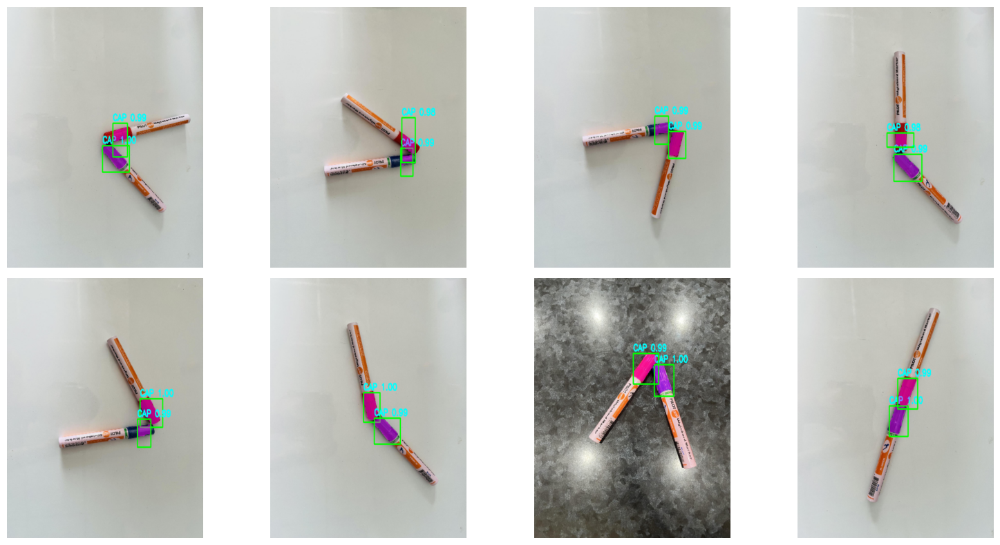

In [ ]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/yolact_r50_markers/epoch_10.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

# ---------------- CONFIG ----------------
# STRIDES = [7.97101449, 15.71428571, 30.55555556, 61.11111111, 110.0]
STRIDES = [8, 16, 32,64, 128]
# STRIDES = [550/69, 550/35, 550/18, 550/9, 550/5]
RATIOS  = [0.5, 1.0, 2.0]
CONF_THR = 0.9
IOU_THR  = 0.3
VARIANCES = [0.1, 0.1, 0.2, 0.2]
NUM_MASK_COEFF = 32
BASE_SIZES = [8,16,32,64,128]
OCTAVE_BASE_SCALE = 3
INPUT_SIZE = 512
CLASS_NAMES = ["CAP"]

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/Pytorch-Models/datasets/markerpensseg/valid/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))

    # img_test = cv2.GaussianBlur(img_resized, (7,7), 0)

    # noise = np.random.normal(0, 20, img_test.shape).astype(np.float32)
    # img_test = np.clip(img_test.astype(np.float32) + noise, 0, 255).astype(np.uint8)

    # small = cv2.resize(img_test, (160,160))
    # img_resized = cv2.resize(small, (512,512))

    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    orig_h, orig_w = img.shape[:2]

    all_boxes = []
    all_scores = []
    all_coeffs = []

    # ----------- DECODE PER FPN LEVEL -----------
    for i, stride in enumerate(STRIDES):

        cls_map   = outputs[i][0]       # (6, H, W)
        bbox_map  = outputs[i+5][0]     # (12, H, W)
        coeff_map = outputs[i+10][0]    # (96, H, W)

        _, H, W = cls_map.shape

        # reshape
        bbox_map  = bbox_map.reshape(3, 4, H, W).transpose(2,3,0,1).reshape(-1,4)

        coeff_map = coeff_map.reshape(3, NUM_MASK_COEFF, H, W)\
                              .transpose(2,3,0,1).reshape(-1,NUM_MASK_COEFF)

        A = 3
        C = cls_map.shape[0] // A

        cls_map = cls_map.reshape(A, C, H, W)
        cls_map = cls_map.transpose(2, 3, 0, 1)  # H,W,A,C
        cls_map = cls_map.reshape(-1, C)

        # print(cls_map.min(), cls_map.max())
        scores = 1 / (1 + np.exp(-cls_map[:,0]))

        # print(np.unique(labels)[:10])

        # anchor centers
        y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')

        feat_sizes = [69,35,18,9,5]
        center_offset = (550 * 0.5) / feat_sizes[i]

        cx = x * stride + center_offset
        cy = y * stride + center_offset

        # print("stride:", stride)
        # print("center_offset:", center_offset)

        # expand to (H,W,A)
        cx = np.repeat(cx[:, :, None], 3, axis=2)
        cy = np.repeat(cy[:, :, None], 3, axis=2)

        # flatten same as bbox_map
        cx = cx.reshape(-1)
        cy = cy.reshape(-1)

        # anchor sizes
        anchor_wh = []
        # ----- generate anchors in SAME order as bbox_map -----
        # base = BASE_SIZES[i] * OCTAVE_BASE_SCALE
        base = stride * OCTAVE_BASE_SCALE

        anchor_wh_level = []
        for r in RATIOS:
            w = base * np.sqrt(r)
            h = base / np.sqrt(r)
            anchor_wh_level.append([w, h])

        anchor_wh_level = np.array(anchor_wh_level)  # (3,2)

        # expand to (H, W, A, 2)
        anchor_wh = np.tile(anchor_wh_level, (H, W, 1, 1))  # (H,W,3,2)

        # flatten SAME as bbox_map
        anchor_wh = anchor_wh.reshape(-1, 2)

        # decode bbox
        dx = bbox_map[:,0]
        dy = bbox_map[:,1]
        dw = bbox_map[:,2]
        dh = bbox_map[:,3]

        px = cx + dx * VARIANCES[0] * anchor_wh[:,0]
        py = cy + dy * VARIANCES[1] * anchor_wh[:,1]
        pw = anchor_wh[:,0] * np.exp(dw * VARIANCES[2])
        ph = anchor_wh[:,1] * np.exp(dh * VARIANCES[3])

        boxes = np.stack([
            px - pw/2,
            py - ph/2,
            px + pw/2,
            py + ph/2
        ], axis=1)

        keep = scores > 0.05
        if np.any(keep):
            all_boxes.append(boxes[keep])
            all_scores.append(scores[keep])
            all_coeffs.append(coeff_map[keep])

    # -------------- CONCAT --------------
    boxes  = np.concatenate(all_boxes)
    scores = np.concatenate(all_scores)
    coeffs = np.concatenate(all_coeffs)

    # -------------- NMS --------------
    # keep only top 200 by score
    topk = 200
    if len(scores) > topk:
        idx = np.argsort(-scores)[:topk]
        boxes  = boxes[idx]
        scores = scores[idx]
        coeffs = coeffs[idx]

    # -------------- FILTER FIRST --------------
    # -------------- NMS --------------
    w = boxes[:,2] - boxes[:,0]
    h = boxes[:,3] - boxes[:,1]
    valid = (w > 1) & (h > 1)

    boxes  = boxes[valid]
    scores = scores[valid]
    coeffs = coeffs[valid]

    # print(boxes[:5])
    # boxes, scores, coeffs = nms_iom(
    #     boxes,
    #     scores,
    #     coeffs,
    #     thr=IOU_THR
    # )
    keep = nms(torch.tensor(boxes).float(), torch.tensor(scores).float(), IOU_THR)

    boxes  = boxes[keep]
    scores = scores[keep]
    coeffs = coeffs[keep]

    mask = scores > CONF_THR
    boxes  = boxes[mask]
    scores = scores[mask]
    coeffs = coeffs[mask]

    # -------------- MASK BUILD --------------
    proto = outputs[15][0]  # (32,128,128)

    # reshape to (H*W, 32)
    proto = proto.reshape(32, -1).transpose(1,0)   # (16384, 32)

    # coeffs: (N,32)
    masks = proto @ coeffs.T   # (16384, N)

    masks = 1 / (1 + np.exp(-masks))  # sigmoid

    masks = masks.transpose(1,0).reshape(-1,128,128)

    # -------------- VISUALIZE --------------
    img_vis = img_resized.copy()

    proto_h, proto_w = 128, 128
    scale_x = proto_w / INPUT_SIZE
    scale_y = proto_h / INPUT_SIZE

    for ib in range(len(boxes)):
        x1,y1,x2,y2 = boxes[ib]

        # Clip in image space
        x1 = max(0, min(INPUT_SIZE-1, x1))
        y1 = max(0, min(INPUT_SIZE-1, y1))
        x2 = max(0, min(INPUT_SIZE-1, x2))
        y2 = max(0, min(INPUT_SIZE-1, y2))

        mask = masks[ib].copy()

        # 1. Resize FIRST
        mask = cv2.resize(mask, (INPUT_SIZE, INPUT_SIZE))

        # 2. Then crop in image space
        crop = np.zeros_like(mask)
        x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

        x1i = max(0, min(INPUT_SIZE-1, x1i))
        y1i = max(0, min(INPUT_SIZE-1, y1i))
        x2i = max(0, min(INPUT_SIZE, x2i))
        y2i = max(0, min(INPUT_SIZE, y2i))

        if x2i > x1i and y2i > y1i:
            crop[y1i:y2i, x1i:x2i] = mask[y1i:y2i, x1i:x2i]

        mask = crop > 0.5

        # Overlay
        img_vis[mask] = img_vis[mask]*0.5 + np.array([255,0,255])*0.5

        cls_name = CLASS_NAMES[0]
        # Draw box
        cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), (0,255,0), 2)
        cv2.putText(img_vis, f"{cls_name} {scores[ib]:.2f}",
                    (int(x1), int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255,255,0),2)

    # Resize final visualization to original size
    img_final = cv2.resize(img_vis, (orig_w, orig_h), interpolation=cv2.INTER_LINEAR)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()


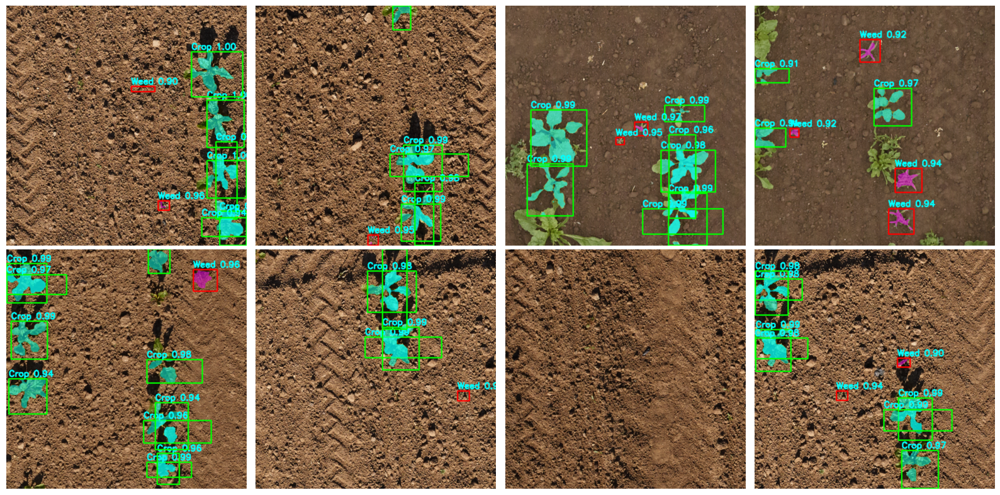

In [ ]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

# ---------------- CONFIG ----------------
# STRIDES = [7.97101449, 15.71428571, 30.55555556, 61.11111111, 110.0]
STRIDES = [8, 16, 32,64, 128]
# STRIDES = [550/69, 550/35, 550/18, 550/9, 550/5]
RATIOS  = [0.5, 1.0, 2.0]
CONF_THR = 0.9
IOU_THR  = 0.5
VARIANCES = [0.1, 0.1, 0.2, 0.2]
NUM_MASK_COEFF = 32
BASE_SIZES = [8,16,32,64,128]
OCTAVE_BASE_SCALE = 3
INPUT_SIZE = 512
CLASS_NAMES = ["Crop", "Weed"]

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))

    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    orig_h, orig_w = img.shape[:2]

    all_boxes = []
    all_scores = []
    all_coeffs = []
    all_boxes2 = []
    all_scores2 = []
    all_coeffs2 = []

    # ----------- DECODE PER FPN LEVEL -----------
    for i, stride in enumerate(STRIDES):

        cls_map   = outputs[i][0]       # (6, H, W)
        bbox_map  = outputs[i+5][0]     # (12, H, W)
        coeff_map = outputs[i+10][0]    # (96, H, W)

        _, H, W = cls_map.shape

        # reshape
        bbox_map  = bbox_map.reshape(3, 4, H, W).transpose(2,3,0,1).reshape(-1,4)

        coeff_map = coeff_map.reshape(3, NUM_MASK_COEFF, H, W)\
                              .transpose(2,3,0,1).reshape(-1,NUM_MASK_COEFF)

        A = 3
        C = cls_map.shape[0] // A

        cls_map = cls_map.reshape(A, C, H, W)
        cls_map = cls_map.transpose(2, 3, 0, 1)  # H,W,A,C
        cls_map = cls_map.reshape(-1, C)

        # print(cls_map.min(), cls_map.max())
        scores = 1 / (1 + np.exp(-cls_map[:,0]))
        # labels = np.argmax(cls_map[:,1:], axis=1)
        # print(np.unique(labels)[:10])
        scores2 = 1 / (1 + np.exp(-cls_map[:,1]))

        # anchor centers
        y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')

        feat_sizes = [69,35,18,9,5]
        center_offset = (550 * 0.5) / feat_sizes[i]

        cx = x * stride + center_offset
        cy = y * stride + center_offset

        # print("stride:", stride)
        # print("center_offset:", center_offset)

        # expand to (H,W,A)
        cx = np.repeat(cx[:, :, None], 3, axis=2)
        cy = np.repeat(cy[:, :, None], 3, axis=2)

        # flatten same as bbox_map
        cx = cx.reshape(-1)
        cy = cy.reshape(-1)

        # anchor sizes
        anchor_wh = []
        # ----- generate anchors in SAME order as bbox_map -----
        # base = BASE_SIZES[i] * OCTAVE_BASE_SCALE
        base = stride * OCTAVE_BASE_SCALE

        anchor_wh_level = []
        for r in RATIOS:
            w = base * np.sqrt(r)
            h = base / np.sqrt(r)
            anchor_wh_level.append([w, h])

        anchor_wh_level = np.array(anchor_wh_level)  # (3,2)

        # expand to (H, W, A, 2)
        anchor_wh = np.tile(anchor_wh_level, (H, W, 1, 1))  # (H,W,3,2)

        # flatten SAME as bbox_map
        anchor_wh = anchor_wh.reshape(-1, 2)

        # decode bbox
        dx = bbox_map[:,0]
        dy = bbox_map[:,1]
        dw = bbox_map[:,2]
        dh = bbox_map[:,3]

        px = cx + dx * VARIANCES[0] * anchor_wh[:,0]
        py = cy + dy * VARIANCES[1] * anchor_wh[:,1]
        pw = anchor_wh[:,0] * np.exp(dw * VARIANCES[2])
        ph = anchor_wh[:,1] * np.exp(dh * VARIANCES[3])

        boxes = np.stack([
            px - pw/2,
            py - ph/2,
            px + pw/2,
            py + ph/2
        ], axis=1)

        keep = scores > 0.005
        if np.any(keep):
            all_boxes.append(boxes[keep])
            all_scores.append(scores[keep])
            all_coeffs.append(coeff_map[keep])

        keep = scores2 > 0.005
        if np.any(keep):
            all_boxes2.append(boxes[keep])
            all_scores2.append(scores2[keep])
            all_coeffs2.append(coeff_map[keep])

    # -------------- CONCAT --------------
    boxes  = np.concatenate(all_boxes)
    scores = np.concatenate(all_scores)
    coeffs = np.concatenate(all_coeffs)
    boxes2  = np.concatenate(all_boxes2)
    scores2 = np.concatenate(all_scores2)
    coeffs2 = np.concatenate(all_coeffs2)

    # -------------- NMS --------------
    # keep only top 200 by score
    topk = 200
    if len(scores) > topk:
        idx = np.argsort(-scores)[:topk]
        boxes  = boxes[idx]
        scores = scores[idx]
        coeffs = coeffs[idx]

    if len(scores2) > topk:
        idx = np.argsort(-scores2)[:topk]
        boxes2  = boxes2[idx]
        scores2 = scores2[idx]
        coeffs2 = coeffs2[idx]

    # -------------- FILTER FIRST --------------
    # -------------- NMS --------------
    w = boxes[:,2] - boxes[:,0]
    h = boxes[:,3] - boxes[:,1]
    valid = (w > 1) & (h > 1)

    boxes  = boxes[valid]
    scores = scores[valid]
    coeffs = coeffs[valid]

    w = boxes2[:,2] - boxes2[:,0]
    h = boxes2[:,3] - boxes2[:,1]
    valid = (w > 1) & (h > 1)

    boxes2  = boxes2[valid]
    scores2 = scores2[valid]
    coeffs2 = coeffs2[valid]

    # print(boxes[:5])
    boxes, scores, coeffs = nms_iom(
        boxes,
        scores,
        coeffs,
        thr=IOU_THR
    )

    boxes2, scores2, coeffs2 =  nms_iom(
        boxes2,
        scores2,
        coeffs2,
        thr=IOU_THR
    )
    # keep = nms(torch.tensor(boxes).float(), torch.tensor(scores).float(), IOU_THR)

    # boxes  = boxes[keep]
    # scores = scores[keep]
    # coeffs = coeffs[keep]
    # labels = labels[keep]

    mask = scores > CONF_THR
    boxes  = boxes[mask]
    scores = scores[mask]
    coeffs = coeffs[mask]

    mask = scores2 > CONF_THR
    boxes2  = boxes2[mask]
    scores2 = scores2[mask]
    coeffs2 = coeffs2[mask]

    # -------------- MASK BUILD --------------
    proto = outputs[15][0]  # (32,128,128)

    # reshape to (H*W, 32)
    proto = proto.reshape(32, -1).transpose(1,0)   # (16384, 32)

    # coeffs: (N,32)
    masks = proto @ coeffs.T   # (16384, N)

    masks = 1 / (1 + np.exp(-masks))  # sigmoid

    masks = masks.transpose(1,0).reshape(-1,128,128)

    masks2 = proto @ coeffs2.T   # (16384, N)
    masks2 = 1 / (1 + np.exp(-masks2))  # sigmoid
    masks2 = masks2.transpose(1,0).reshape(-1,128,128)
    # -------------- VISUALIZE --------------
    img_vis = img_resized.copy()

    proto_h, proto_w = 128, 128
    scale_x = proto_w / INPUT_SIZE
    scale_y = proto_h / INPUT_SIZE

    for ib in range(len(boxes)):
        x1,y1,x2,y2 = boxes[ib]

        # Clip in image space
        x1 = max(0, min(INPUT_SIZE-1, x1))
        y1 = max(0, min(INPUT_SIZE-1, y1))
        x2 = max(0, min(INPUT_SIZE-1, x2))
        y2 = max(0, min(INPUT_SIZE-1, y2))

        mask = masks[ib].copy()

        # 1. Resize FIRST
        mask = cv2.resize(mask, (INPUT_SIZE, INPUT_SIZE))

        # 2. Then crop in image space
        crop = np.zeros_like(mask)
        x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

        x1i = max(0, min(INPUT_SIZE-1, x1i))
        y1i = max(0, min(INPUT_SIZE-1, y1i))
        x2i = max(0, min(INPUT_SIZE, x2i))
        y2i = max(0, min(INPUT_SIZE, y2i))

        if x2i > x1i and y2i > y1i:
            crop[y1i:y2i, x1i:x2i] = mask[y1i:y2i, x1i:x2i]

        mask = crop > 0.5
        cls_name = CLASS_NAMES[0]

        color = (255, 255, 0) if cls_name == "Crop" else (255, 0, 255)
        # Overlay
        img_vis[mask] = img_vis[mask]*0.5 + np.array(color)*0.5

        # Draw box
        cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), (0,255,0), 2)
        cv2.putText(img_vis, f"{cls_name} {scores[ib]:.2f}",
                    (int(x1), int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255,255,0),2)

    for ibb in range(len(boxes2)):
        x1,y1,x2,y2 = boxes2[ibb]

        # Clip in image space
        x1 = max(0, min(INPUT_SIZE-1, x1))
        y1 = max(0, min(INPUT_SIZE-1, y1))
        x2 = max(0, min(INPUT_SIZE-1, x2))
        y2 = max(0, min(INPUT_SIZE-1, y2))

        mask2 = masks2[ibb].copy()

        # 1. Resize FIRST
        mask2 = cv2.resize(mask2, (INPUT_SIZE, INPUT_SIZE))

        # 2. Then crop in image space
        crop2 = np.zeros_like(mask2)
        x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

        x1i = max(0, min(INPUT_SIZE-1, x1i))
        y1i = max(0, min(INPUT_SIZE-1, y1i))
        x2i = max(0, min(INPUT_SIZE, x2i))
        y2i = max(0, min(INPUT_SIZE, y2i))

        if x2i > x1i and y2i > y1i:
            crop2[y1i:y2i, x1i:x2i] = mask2[y1i:y2i, x1i:x2i]

        mask2 = crop2 > 0.5
        cls_name = CLASS_NAMES[1]

        color = (255, 255, 0) if cls_name == "Crop" else (255, 0, 255)
        # Overlay
        img_vis[mask2] = img_vis[mask2]*0.5 + np.array(color)*0.5
        color = (0, 255, 0) if cls_name == "Crop" else (0, 0, 255)
        # Draw box
        cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), color, 2)
        cv2.putText(img_vis, f"{cls_name} {scores2[ibb]:.2f}",
                    (int(x1), int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255,255,0),2)

    # Resize final visualization to original size
    img_final = cv2.resize(img_vis, (orig_w, orig_h), interpolation=cv2.INTER_LINEAR)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()

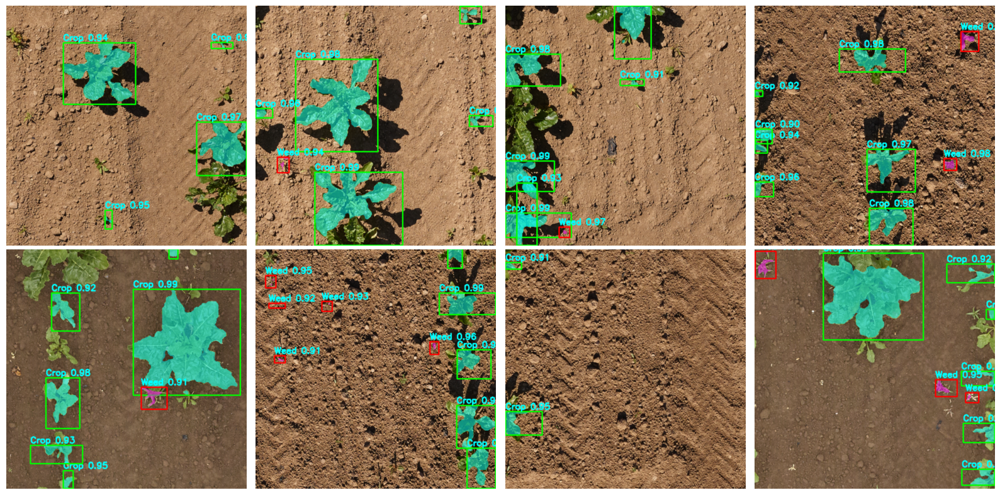

In [23]:
mean = np.array([123.675, 116.28, 103.53], dtype=np.float32)
std = np.array([58.395, 57.12, 57.375], dtype=np.float32)

session = onnxruntime.InferenceSession("mmdetection/mmdet_outputs/yolact_r50_pheno/epoch_3.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

# ---------------- CONFIG ----------------
# STRIDES = [7.97101449, 15.71428571, 30.55555556, 61.11111111, 110.0]
STRIDES = [8, 16, 32,64, 128]
# STRIDES = [550/69, 550/35, 550/18, 550/9, 550/5]
RATIOS  = [0.5, 1.0, 2.0]
CONF_THR = 0.9
IOU_THR  = 0.3
VARIANCES = [0.1, 0.1, 0.2, 0.2]
NUM_MASK_COEFF = 32
BASE_SIZES = [8,16,32,64,128]
OCTAVE_BASE_SCALE = 3
INPUT_SIZE = 512
CLASS_NAMES = ["Crop", "Weed"]

# ---------------- CONFIG ----------------
val_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for ii, image in enumerate(sample_imgs):
    plt.subplot(2, 4, ii+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (512, 512))

    img_input = (img_resized[:, :, ::-1].astype(np.float32) - mean) / std
    img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

    outputs = session.run(None, {input_name: img_input})

    orig_h, orig_w = img.shape[:2]

    all_boxes = []
    all_scores = []
    all_coeffs = []
    all_boxes2 = []
    all_scores2 = []
    all_coeffs2 = []

    # ----------- DECODE PER FPN LEVEL -----------
    for i, stride in enumerate(STRIDES):

        cls_map   = outputs[i][0]       # (6, H, W)
        bbox_map  = outputs[i+5][0]     # (12, H, W)
        coeff_map = outputs[i+10][0]    # (96, H, W)

        _, H, W = cls_map.shape

        # reshape
        bbox_map  = bbox_map.reshape(3, 4, H, W).transpose(2,3,0,1).reshape(-1,4)

        coeff_map = coeff_map.reshape(3, NUM_MASK_COEFF, H, W)\
                              .transpose(2,3,0,1).reshape(-1,NUM_MASK_COEFF)

        A = 3
        C = cls_map.shape[0] // A

        cls_map = cls_map.reshape(A, C, H, W)
        cls_map = cls_map.transpose(2, 3, 0, 1)  # H,W,A,C
        cls_map = cls_map.reshape(-1, C)

        # print(cls_map.min(), cls_map.max())
        scores = 1 / (1 + np.exp(-cls_map[:,0]))
        # labels = np.argmax(cls_map[:,1:], axis=1)
        # print(np.unique(labels)[:10])
        scores2 = 1 / (1 + np.exp(-cls_map[:,1]))

        # anchor centers
        y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')

        feat_sizes = [69,35,18,9,5]
        center_offset = (550 * 0.5) / feat_sizes[i]

        cx = x * stride + center_offset
        cy = y * stride + center_offset

        # print("stride:", stride)
        # print("center_offset:", center_offset)

        # expand to (H,W,A)
        cx = np.repeat(cx[:, :, None], 3, axis=2)
        cy = np.repeat(cy[:, :, None], 3, axis=2)

        # flatten same as bbox_map
        cx = cx.reshape(-1)
        cy = cy.reshape(-1)

        # anchor sizes
        anchor_wh = []
        # ----- generate anchors in SAME order as bbox_map -----
        # base = BASE_SIZES[i] * OCTAVE_BASE_SCALE
        base = stride * OCTAVE_BASE_SCALE

        anchor_wh_level = []
        for r in RATIOS:
            w = base * np.sqrt(r)
            h = base / np.sqrt(r)
            anchor_wh_level.append([w, h])

        anchor_wh_level = np.array(anchor_wh_level)  # (3,2)

        # expand to (H, W, A, 2)
        anchor_wh = np.tile(anchor_wh_level, (H, W, 1, 1))  # (H,W,3,2)

        # flatten SAME as bbox_map
        anchor_wh = anchor_wh.reshape(-1, 2)

        # decode bbox
        dx = bbox_map[:,0]
        dy = bbox_map[:,1]
        dw = bbox_map[:,2]
        dh = bbox_map[:,3]

        px = cx + dx * VARIANCES[0] * anchor_wh[:,0]
        py = cy + dy * VARIANCES[1] * anchor_wh[:,1]
        pw = anchor_wh[:,0] * np.exp(dw * VARIANCES[2])
        ph = anchor_wh[:,1] * np.exp(dh * VARIANCES[3])

        boxes = np.stack([
            px - pw/2,
            py - ph/2,
            px + pw/2,
            py + ph/2
        ], axis=1)

        keep = scores > 0.005
        if np.any(keep):
            all_boxes.append(boxes[keep])
            all_scores.append(scores[keep])
            all_coeffs.append(coeff_map[keep])

        keep = scores2 > 0.005
        if np.any(keep):
            all_boxes2.append(boxes[keep])
            all_scores2.append(scores2[keep])
            all_coeffs2.append(coeff_map[keep])

    # -------------- CONCAT --------------
    boxes  = np.concatenate(all_boxes)
    scores = np.concatenate(all_scores)
    coeffs = np.concatenate(all_coeffs)
    boxes2  = np.concatenate(all_boxes2)
    scores2 = np.concatenate(all_scores2)
    coeffs2 = np.concatenate(all_coeffs2)

    # -------------- NMS --------------
    # keep only top 200 by score
    topk = 200
    if len(scores) > topk:
        idx = np.argsort(-scores)[:topk]
        boxes  = boxes[idx]
        scores = scores[idx]
        coeffs = coeffs[idx]

    if len(scores2) > topk:
        idx = np.argsort(-scores2)[:topk]
        boxes2  = boxes2[idx]
        scores2 = scores2[idx]
        coeffs2 = coeffs2[idx]

    # -------------- FILTER FIRST --------------
    # -------------- NMS --------------
    w = boxes[:,2] - boxes[:,0]
    h = boxes[:,3] - boxes[:,1]
    valid = (w > 1) & (h > 1)

    boxes  = boxes[valid]
    scores = scores[valid]
    coeffs = coeffs[valid]

    w = boxes2[:,2] - boxes2[:,0]
    h = boxes2[:,3] - boxes2[:,1]
    valid = (w > 1) & (h > 1)

    boxes2  = boxes2[valid]
    scores2 = scores2[valid]
    coeffs2 = coeffs2[valid]

    # print(boxes[:5])
    boxes, scores, coeffs = nms_iom(
        boxes,
        scores,
        coeffs,
        thr=IOU_THR
    )

    boxes2, scores2, coeffs2 =  nms_iom(
        boxes2,
        scores2,
        coeffs2,
        thr=IOU_THR
    )
    # keep = nms(torch.tensor(boxes).float(), torch.tensor(scores).float(), IOU_THR)

    # boxes  = boxes[keep]
    # scores = scores[keep]
    # coeffs = coeffs[keep]
    # labels = labels[keep]

    mask = scores > CONF_THR
    boxes  = boxes[mask]
    scores = scores[mask]
    coeffs = coeffs[mask]

    mask = scores2 > CONF_THR
    boxes2  = boxes2[mask]
    scores2 = scores2[mask]
    coeffs2 = coeffs2[mask]

    # -------------- MASK BUILD --------------
    proto = outputs[15][0]  # (32,128,128)

    # reshape to (H*W, 32)
    proto = proto.reshape(32, -1).transpose(1,0)   # (16384, 32)

    # coeffs: (N,32)
    masks = proto @ coeffs.T   # (16384, N)

    masks = 1 / (1 + np.exp(-masks))  # sigmoid

    masks = masks.transpose(1,0).reshape(-1,128,128)

    masks2 = proto @ coeffs2.T   # (16384, N)
    masks2 = 1 / (1 + np.exp(-masks2))  # sigmoid
    masks2 = masks2.transpose(1,0).reshape(-1,128,128)
    # -------------- VISUALIZE --------------
    img_vis = img_resized.copy()

    proto_h, proto_w = 128, 128
    scale_x = proto_w / INPUT_SIZE
    scale_y = proto_h / INPUT_SIZE

    for ib in range(len(boxes)):
        x1,y1,x2,y2 = boxes[ib]

        # Clip in image space
        x1 = max(0, min(INPUT_SIZE-1, x1))
        y1 = max(0, min(INPUT_SIZE-1, y1))
        x2 = max(0, min(INPUT_SIZE-1, x2))
        y2 = max(0, min(INPUT_SIZE-1, y2))

        mask = masks[ib].copy()

        # 1. Resize FIRST
        mask = cv2.resize(mask, (INPUT_SIZE, INPUT_SIZE))

        # 2. Then crop in image space
        crop = np.zeros_like(mask)
        x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

        x1i = max(0, min(INPUT_SIZE-1, x1i))
        y1i = max(0, min(INPUT_SIZE-1, y1i))
        x2i = max(0, min(INPUT_SIZE, x2i))
        y2i = max(0, min(INPUT_SIZE, y2i))

        if x2i > x1i and y2i > y1i:
            crop[y1i:y2i, x1i:x2i] = mask[y1i:y2i, x1i:x2i]

        mask = crop > 0.5
        cls_name = CLASS_NAMES[0]

        color = (255, 255, 0) if cls_name == "Crop" else (255, 0, 255)
        # Overlay
        img_vis[mask] = img_vis[mask]*0.5 + np.array(color)*0.5

        # Draw box
        cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), (0,255,0), 2)
        cv2.putText(img_vis, f"{cls_name} {scores[ib]:.2f}",
                    (int(x1), int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255,255,0),2)

    for ibb in range(len(boxes2)):
        x1,y1,x2,y2 = boxes2[ibb]

        # Clip in image space
        x1 = max(0, min(INPUT_SIZE-1, x1))
        y1 = max(0, min(INPUT_SIZE-1, y1))
        x2 = max(0, min(INPUT_SIZE-1, x2))
        y2 = max(0, min(INPUT_SIZE-1, y2))

        mask2 = masks2[ibb].copy()

        # 1. Resize FIRST
        mask2 = cv2.resize(mask2, (INPUT_SIZE, INPUT_SIZE))

        # 2. Then crop in image space
        crop2 = np.zeros_like(mask2)
        x1i, y1i, x2i, y2i = map(int, [x1, y1, x2, y2])

        x1i = max(0, min(INPUT_SIZE-1, x1i))
        y1i = max(0, min(INPUT_SIZE-1, y1i))
        x2i = max(0, min(INPUT_SIZE, x2i))
        y2i = max(0, min(INPUT_SIZE, y2i))

        if x2i > x1i and y2i > y1i:
            crop2[y1i:y2i, x1i:x2i] = mask2[y1i:y2i, x1i:x2i]

        mask2 = crop2 > 0.5
        cls_name = CLASS_NAMES[1]

        color = (255, 255, 0) if cls_name == "Crop" else (255, 0, 255)
        # Overlay
        img_vis[mask2] = img_vis[mask2]*0.5 + np.array(color)*0.5
        color = (0, 255, 0) if cls_name == "Crop" else (0, 0, 255)
        # Draw box
        cv2.rectangle(img_vis, (int(x1),int(y1)), (int(x2),int(y2)), color, 2)
        cv2.putText(img_vis, f"{cls_name} {scores2[ibb]:.2f}",
                    (int(x1), int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255,255,0),2)

    # Resize final visualization to original size
    img_final = cv2.resize(img_vis, (orig_w, orig_h), interpolation=cv2.INTER_LINEAR)

    plt.subplot(rows, cols, ii + 1)
    plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()